# Seismic Prediction Visualization (LR / Pred / HR)

This notebook reads all `*_pred.dat` files in `runs/samples`, finds matching LR/HR data by filename, and plots multi-row 3-column subplots.

Found predictions: 16
Plotted pairs: 16


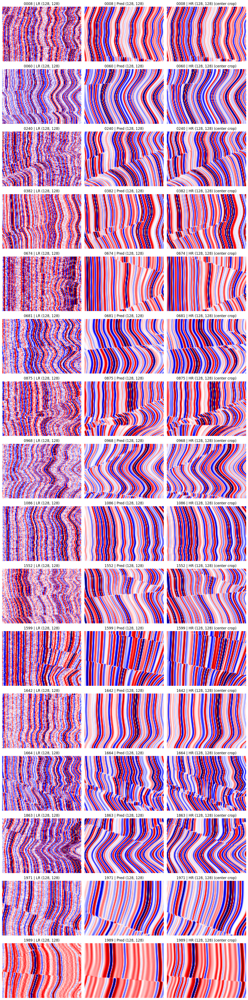

In [ ]:
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt

# Paths
ROOT = Path('/home/llp/data/Resolution/SeismicDiffusion_Resolution')
PRED_DIR = ROOT / 'runs' / 'samples'
LR_DIR = Path('/home/llp/data/Resolution/seismicSuperResolutionData/nx2')
HR_DIR = Path('/home/llp/data/Resolution/seismicSuperResolutionData/sx')

# Known shapes for this dataset
LR_SHAPE = (128, 128)
HR_SHAPE = (256, 256)
DTYPE = np.float32


def load_dat(path: Path, shape, dtype=DTYPE):
    arr = np.fromfile(path, dtype=dtype)
    expected = int(np.prod(shape))
    if arr.size != expected:
        raise ValueError(f'{path} has {arr.size} values, expected {expected} for shape={shape}')
    return arr.reshape(shape)


def infer_pred_shape(path: Path):
    arr = np.fromfile(path, dtype=DTYPE)
    n = arr.size
    if n == int(np.prod(HR_SHAPE)):
        return arr.reshape(HR_SHAPE)
    if n == int(np.prod(LR_SHAPE)):
        return arr.reshape(LR_SHAPE)

    # Fallback: try square
    s = int(np.sqrt(n))
    if s * s == n:
        return arr.reshape((s, s))
    raise ValueError(f'Cannot infer shape for {path}, value count={n}')


def center_crop(x, out_h, out_w):
    h, w = x.shape
    if out_h > h or out_w > w:
        raise ValueError(f'Cannot crop {x.shape} to {(out_h, out_w)}')
    y0 = (h - out_h) // 2
    x0 = (w - out_w) // 2
    return x[y0:y0 + out_h, x0:x0 + out_w]


pred_files = sorted(PRED_DIR.glob('*_pred.dat'))
if not pred_files:
    raise RuntimeError(f'No prediction files found in: {PRED_DIR}')

rows = []
missing = []
for pred_path in pred_files:
    stem = pred_path.name.replace('_pred.dat', '')
    lr_path = LR_DIR / f'{stem}.dat'
    hr_path = HR_DIR / f'{stem}.dat'

    if not lr_path.exists() or not hr_path.exists():
        missing.append(stem)
        continue

    lr = load_dat(lr_path, LR_SHAPE)
    hr = load_dat(hr_path, HR_SHAPE)
    pred = infer_pred_shape(pred_path)

    if pred.shape != hr.shape:
        hr_disp = center_crop(hr, pred.shape[0], pred.shape[1])
    else:
        hr_disp = hr

    rows.append((stem, lr, pred, hr_disp))

print(f'Found predictions: {len(pred_files)}')
print(f'Plotted pairs: {len(rows)}')
if missing:
    print(f'Missing LR/HR for: {missing}')

n = len(rows)
fig_h = max(3 * n, 4)
fig, axes = plt.subplots(n, 3, figsize=(12, fig_h), squeeze=False)

for i, (name, lr, pred, hr) in enumerate(rows):
    # Use robust shared color range per row
    all_vals = np.concatenate([lr.ravel(), pred.ravel(), hr.ravel()])
    vmin, vmax = np.quantile(all_vals, [0.01, 0.99])

    axes[i, 0].imshow(lr.T, cmap='seismic', aspect='auto', vmin=vmin, vmax=vmax)
    axes[i, 0].set_title(f'{name} | LR {lr.shape}')

    axes[i, 1].imshow(pred.T, cmap='seismic', aspect='auto', vmin=vmin, vmax=vmax)
    axes[i, 1].set_title(f'{name} | Pred {pred.shape}')

    axes[i, 2].imshow(hr.T, cmap='seismic', aspect='auto', vmin=vmin, vmax=vmax)
    title = f'{name} | HR {hr.shape}'
    if hr.shape != HR_SHAPE:
        title += ' (center crop)'
    axes[i, 2].set_title(title)

    for j in range(3):
        axes[i, j].axis('off')

plt.tight_layout()
plt.show()
